### Install package from console or within script

In [1]:
# install package into your environment through your console via
# pip install ABRSQOL
# or install it from this script:
import subprocess, sys
try:
    __import__('aabpl')
except ImportError:
    print(f"Package '{'aabpl'}' not found. Installing...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", 'aabpl'])

### set up working directory and folders

In [2]:
import os
# Create output folders if they don't exist
working_directory = "./" # specify your folder path here C:/User/YourName/YourFolder
output_data_folder = os.path.join(working_directory, "output_data/")
output_gis_folder = os.path.join(working_directory, "output_gis/")
output_maps_folder = os.path.join(working_directory, "output_maps/")
temp_folder = os.path.join(working_directory, "temp")
os.makedirs(output_data_folder, exist_ok=True)
os.makedirs(output_gis_folder, exist_ok=True)
os.makedirs(output_maps_folder, exist_ok=True)
os.makedirs(temp_folder, exist_ok=True)

### Import packages

In [3]:
from pandas import read_csv
from aabpl.main import detect_cluster_pts, radius_search, convert_coords_to_local_crs, detect_cells_with_cluster_pts
from aabpl.testing.test_performance import analyze_func_perf, func_timer_dict

In [4]:
path_to_your_csv = '../../cbsa_sample_data/plants_10180.txt'
crs_of_your_csv =  "EPSG:4326"
pts_df = read_csv(path_to_your_csv, sep=",", header=None)
pts_df.columns = ["eid", "employment", "industry", "lat","lon","moved"]

# automatically detect most local projection
local_crs = convert_coords_to_local_crs(pts_df)

## Detecting clustered points and cells: 
1. Calculate the sum for each point of pts_df for specified variable(s) within specified radius
2. Draw random points within area and calculate the sum for each point of the original dataset for specified variable(s) within specified radius pts_df
3. Label all pts in which radius the sum exceeds the threshold value for specified percentile of given region. label those points as cluster points
4. Label all cells that at least contain one point exceeding that threshold as cluster cells 
5. Merge all cells that lie in the vecinity of each other (distance between region centroids below distance_thresholds) into single clusters
6. Additionaly include cells within a cluster that lie in its convex hull.
7. Returning pts_df with columns on radius sums and cluster ids aswell as grid including cluster information 

### Functions and the steps they execute
- radius_search: 1
- get_distribution_for_random_points: 2.
- detect_cluster_pts: 3.
- detect_cells_with_cluster_pts: 4.-7. 

In [5]:
grid = detect_cells_with_cluster_pts(
    pts_df=pts_df,
    crs=local_crs,
    radius=750,
    include_boundary=False,
    exclude_pt_itself=True,
    distance_thresholds=2500,
    k_th_percentiles=[99.97],
    n_random_points=int(1e5),
    make_convex=True,
    random_seed=0,
    sum_names=['employment'],
    silent = True,
)

## Save DataFrames with radius sums and clusters
Using all the save options below is most likely excessive. saving the shapefile for save_grid_clusters and save_sparse_grid is most likely sufficient

In [6]:
# save files as needed
# save only only clusters including their geometry, aggregate values, area and id
grid.save_grid_clusters(filename=output_gis_folder+'grid_clusters', file_format='shp', target_crs=crs_of_your_csv)
# grid.save_grid_clusters(filename=output_data_folder+'grid_clusters', file_format='csv', target_crs=crs_of_your_csv)
# save sparse grid including cells only those cells that at least contain one point
grid.save_sparse_grid(filename=output_gis_folder+'grid_clusters', file_format='shp', target_crs=crs_of_your_csv)
# grid.save_sparse_grid(filename=output_data_folder+'grid_clusters', file_format='csv', target_crs=crs_of_your_csv)
# save full grid including cells that have no points in them (through many empty cells this will occuppy unecessary disk space)
# grid.save_full_grid(filename=output_gis_folder+'grid_clusters', file_format='shp', target_crs=crs_of_your_csv)
# grid.save_full_grid(filename=output_data_folder+'grid_clusters', file_format='csv', target_crs=crs_of_your_csv)

pts_df.to_csv(output_data_folder+'pts_df_w_clusters.csv')

c:\Users\mmyli\anaconda3\envs\primelocations\Lib\site-packages\pyproj\transformer.py:820: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return self._transformer._transform_point(


## Create Plots

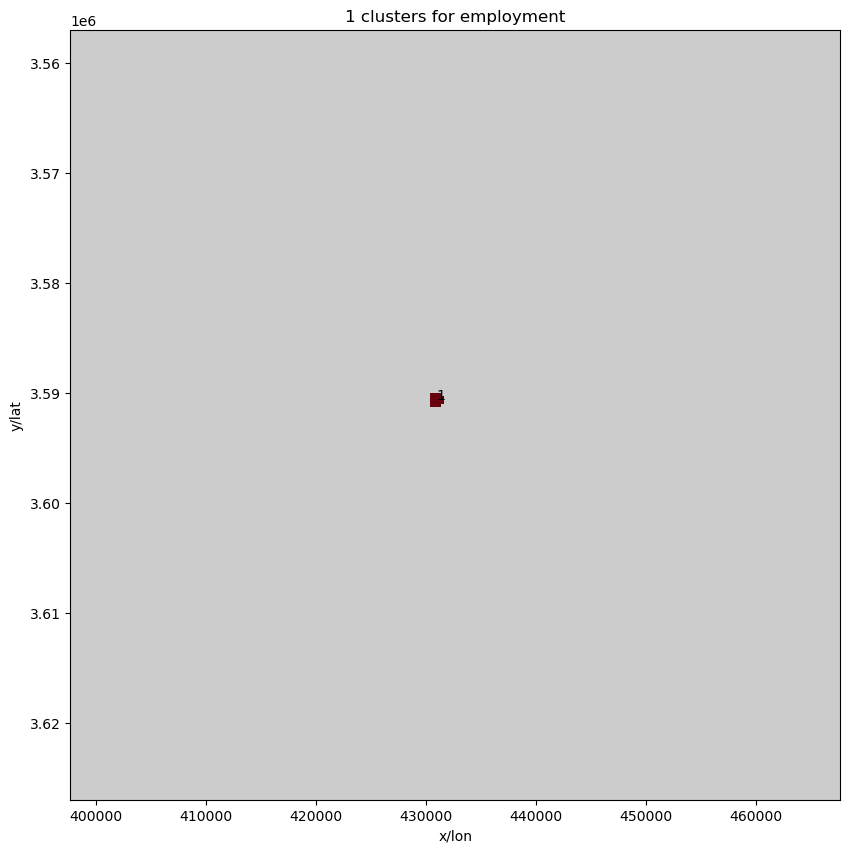

In [7]:
grid.plot_all_clusters(output_maps_folder+'clusters_employment_750m_9975th')

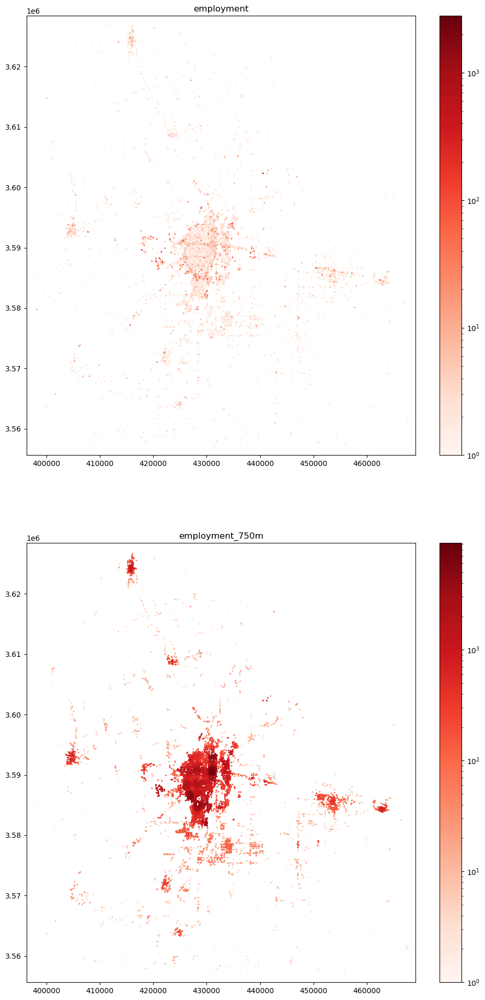

In [8]:
grid.plot_vars(filename=output_maps_folder+'employment_vars')


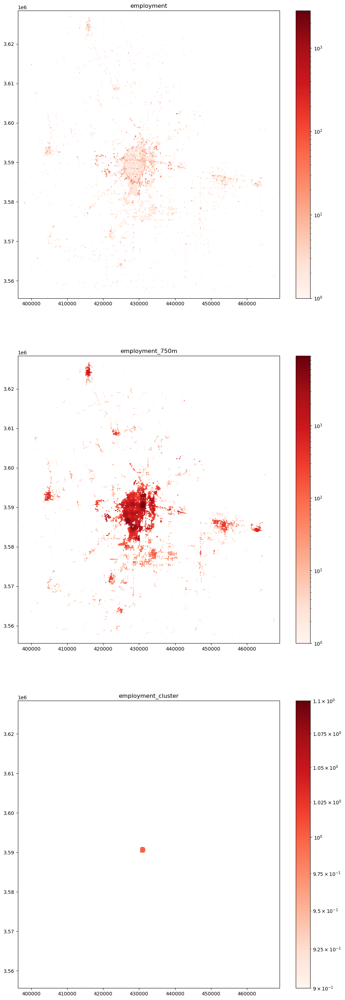

In [9]:
grid.plot_cluster_pts(filename=output_maps_folder+'employment_cluster_pts')

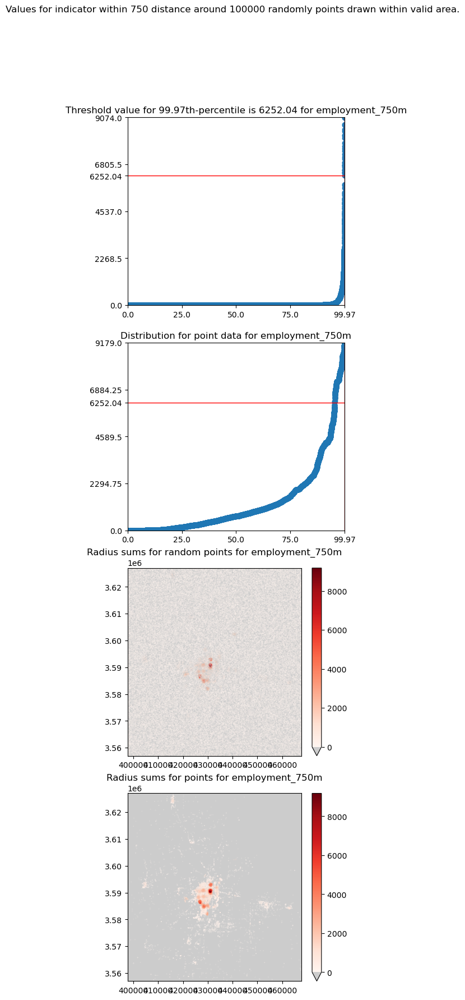

In [10]:
grid.plot_rand_dist(filename=output_maps_folder+'rand_dist_employment')

## For development use only 

row: eid                   8.042086e+07
employment            1.000000e+00
industry              5.324900e+05
lat                   3.588506e+06
lon                   4.338256e+05
moved                 2.010000e+03
id_y                  1.250000e+02
id_x                  1.430000e+02
region_comb_nr        3.340000e+02
cell_region           5.608300e+04
employment_750m       0.000000e+00
employment_cluster    0.000000e+00
initial_sort          7.580000e+03
Name: 2892, dtype: float64
cells_cntd_by_pt_cell [(124, 142), (124, 143), (124, 144), (125, 142), (125, 143), (125, 144), (126, 142), (126, 143), (126, 144)]
cells_contained_by_pt_region [(123, 142), (123, 143), (123, 144), (124, 141), (124, 145), (125, 141), (125, 145), (127, 143)]
cells_overlapped_by_pt_region [(122, 141), (122, 142), (122, 143), (122, 144), (122, 145), (123, 140), (123, 141), (123, 145), (123, 146), (124, 140), (124, 146), (125, 140), (125, 146), (126, 140), (126, 141), (126, 145), (126, 146), (127, 141), (127, 142

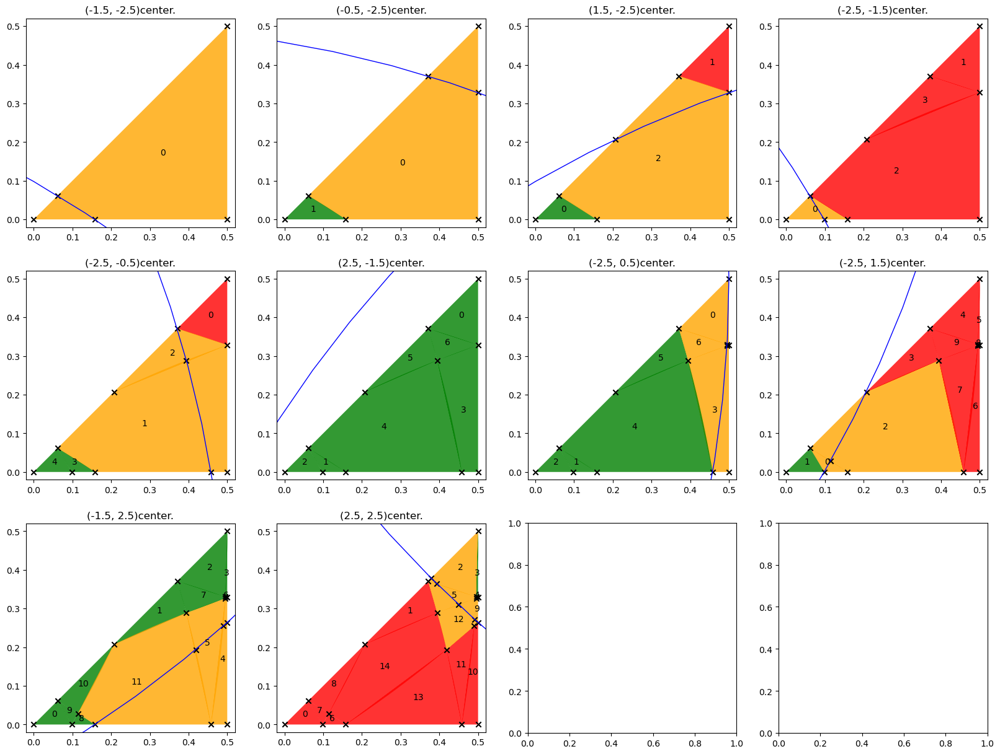

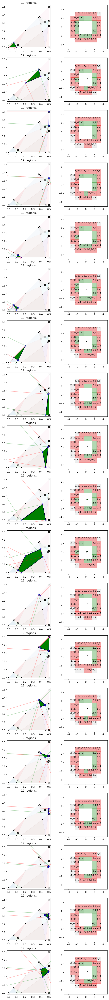

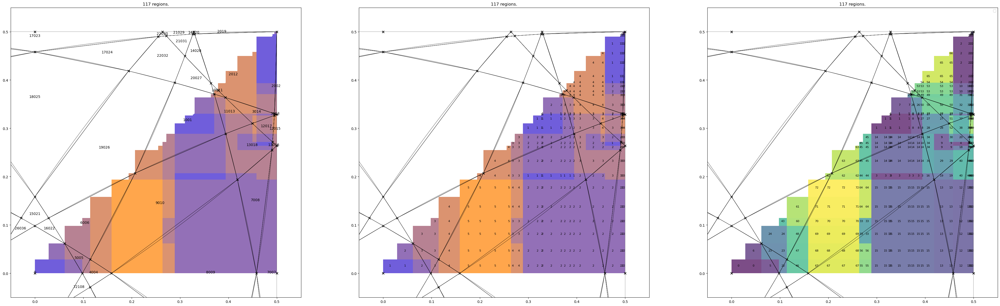

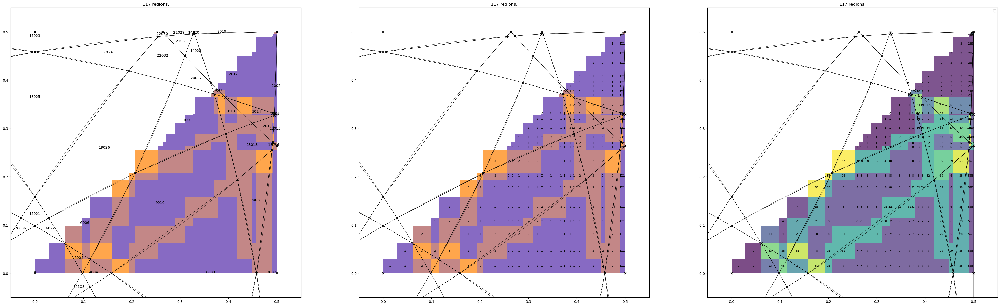

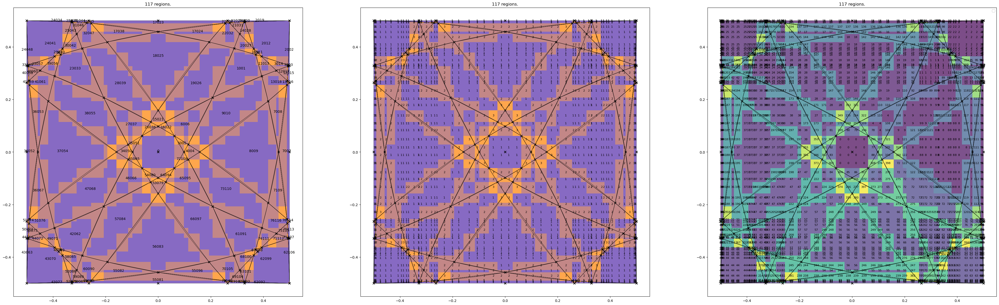

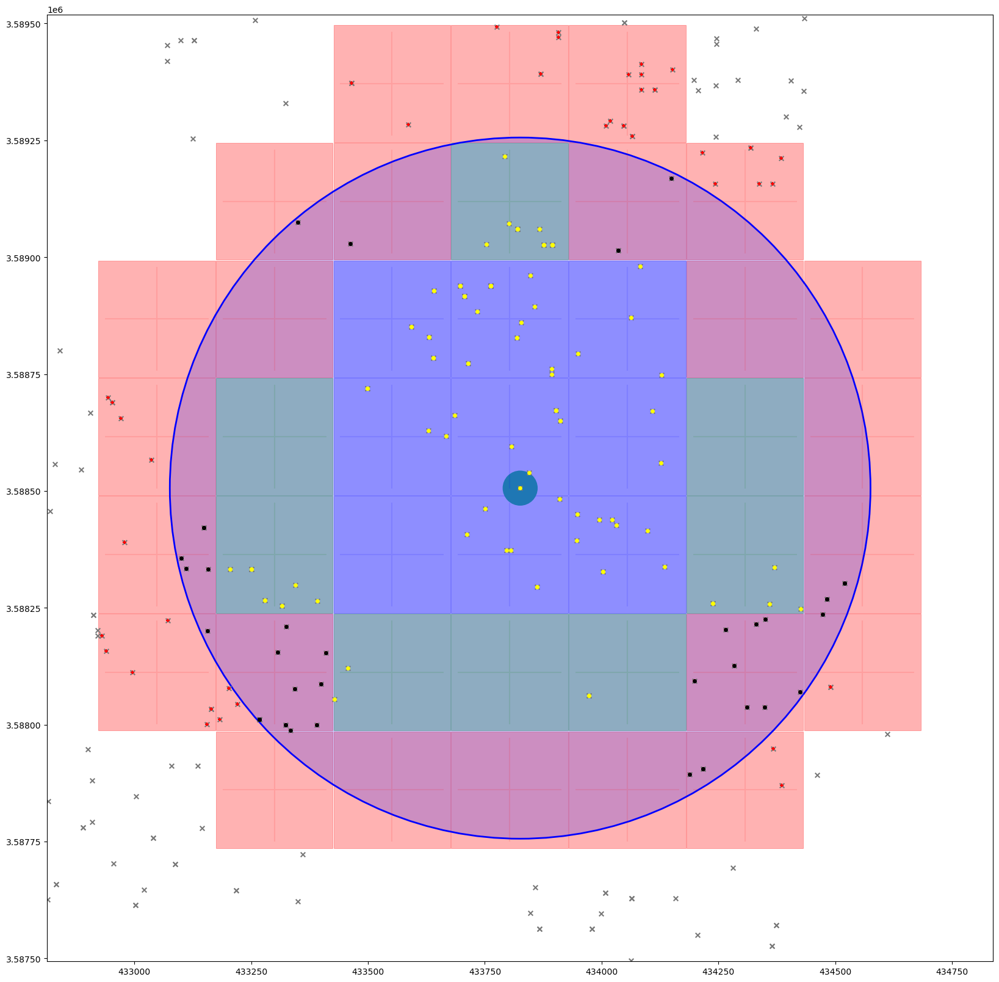

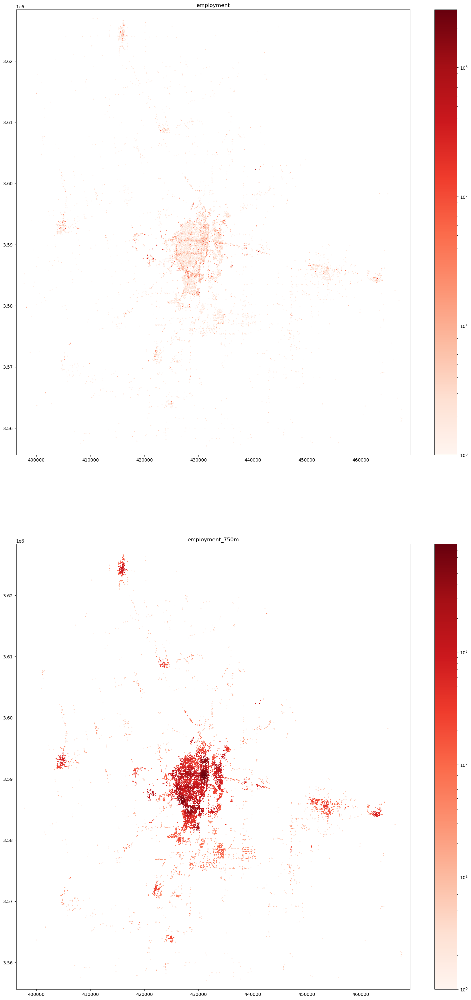

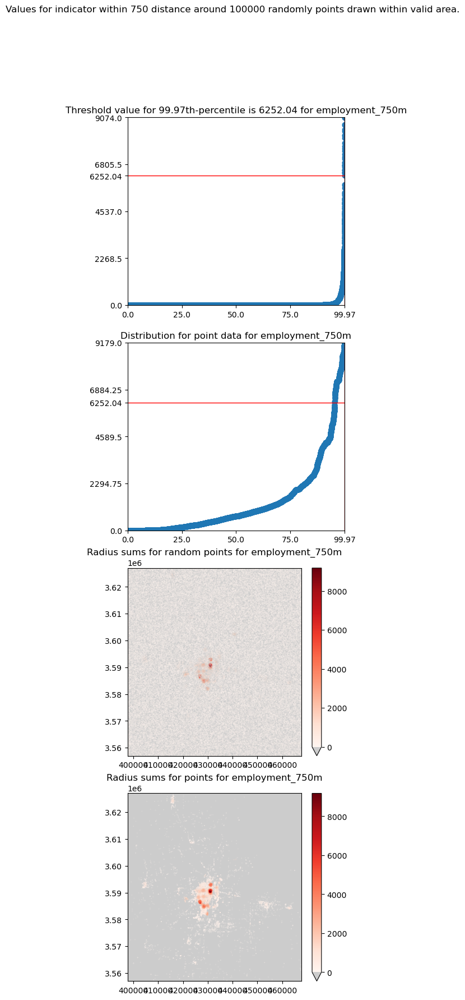

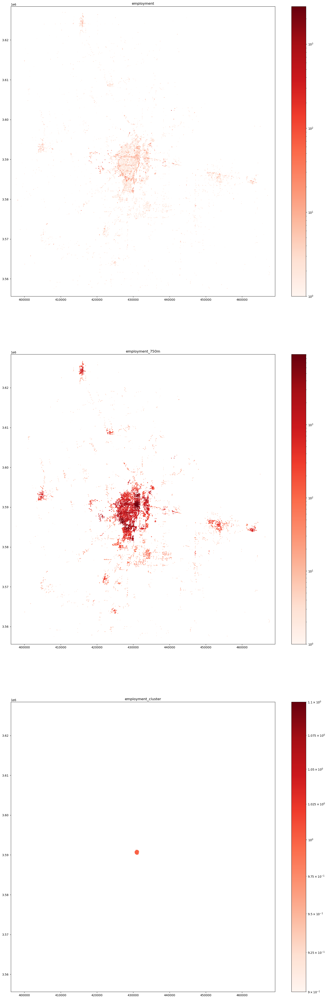

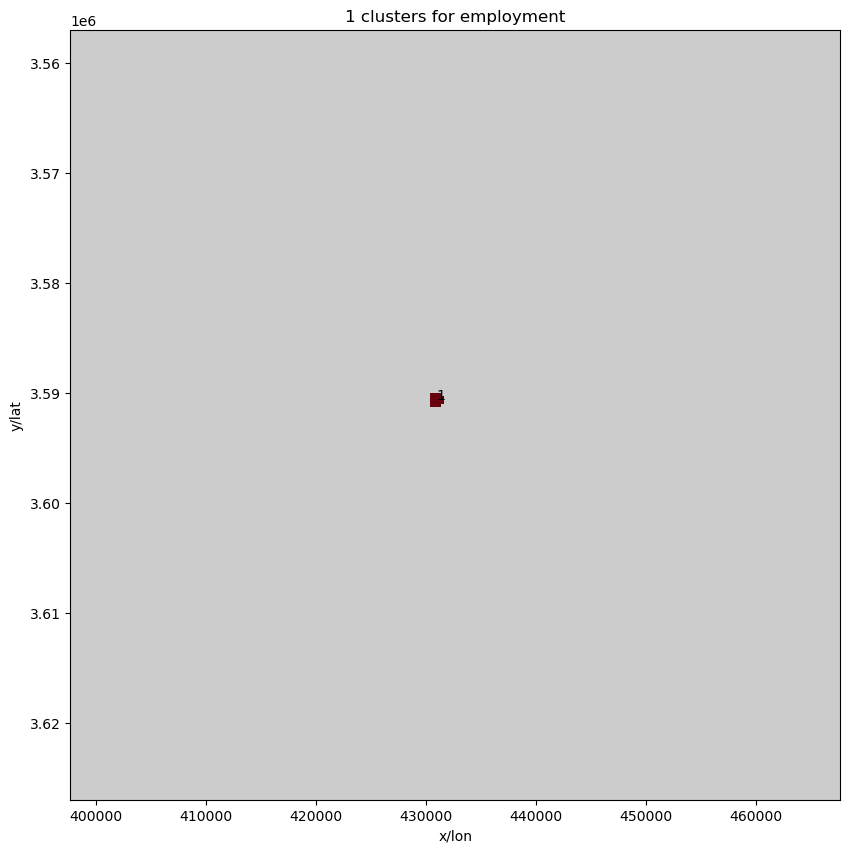

In [14]:
grid = detect_cells_with_cluster_pts(
    pts_df=pts_df,
    crs=local_crs,
    radius=750,
    include_boundary=False,
    exclude_pt_itself=True,
    distance_thresholds=2500,
    k_th_percentiles=[99.97],
    n_random_points=int(1e5),
    make_convex=True,
    random_seed=0,
    sum_names=['employment'],
    plot_distribution={},
    plot_radius_sums={},
    plot_cluster_points={},
    plot_pt_disk={},
    plot_cell_reg_assign={},
    plot_offset_checks={},
    plot_offset_regions={},
    plot_offset_raster={},
    plot_cluster_cells={},
    silent = True,
)

row: eid                1.592609e+07
employment         1.500000e+01
industry           8.111110e+05
lat                3.588506e+06
lon                4.259468e+05
moved              2.015000e+03
id_y               1.250000e+02
id_x               1.120000e+02
region_comb_nr     1.340000e+02
cell_region        5.508200e+04
employment_750m    0.000000e+00
initial_sort       7.480000e+03
Name: 3149, dtype: float64
cells_cntd_by_pt_cell [(124, 111), (124, 112), (124, 113), (125, 111), (125, 112), (125, 113), (126, 111), (126, 112), (126, 113)]
cells_contained_by_pt_region [(123, 111), (123, 112), (123, 113), (124, 110), (124, 114), (125, 110), (125, 114)]
cells_overlapped_by_pt_region [(122, 110), (122, 111), (122, 112), (122, 113), (122, 114), (123, 109), (123, 110), (123, 114), (123, 115), (124, 109), (124, 115), (125, 109), (125, 115), (126, 109), (126, 110), (126, 114), (126, 115), (127, 110), (127, 111), (127, 112), (127, 113), (127, 114), (128, 111), (128, 112)]
counter_new_cell 0.2

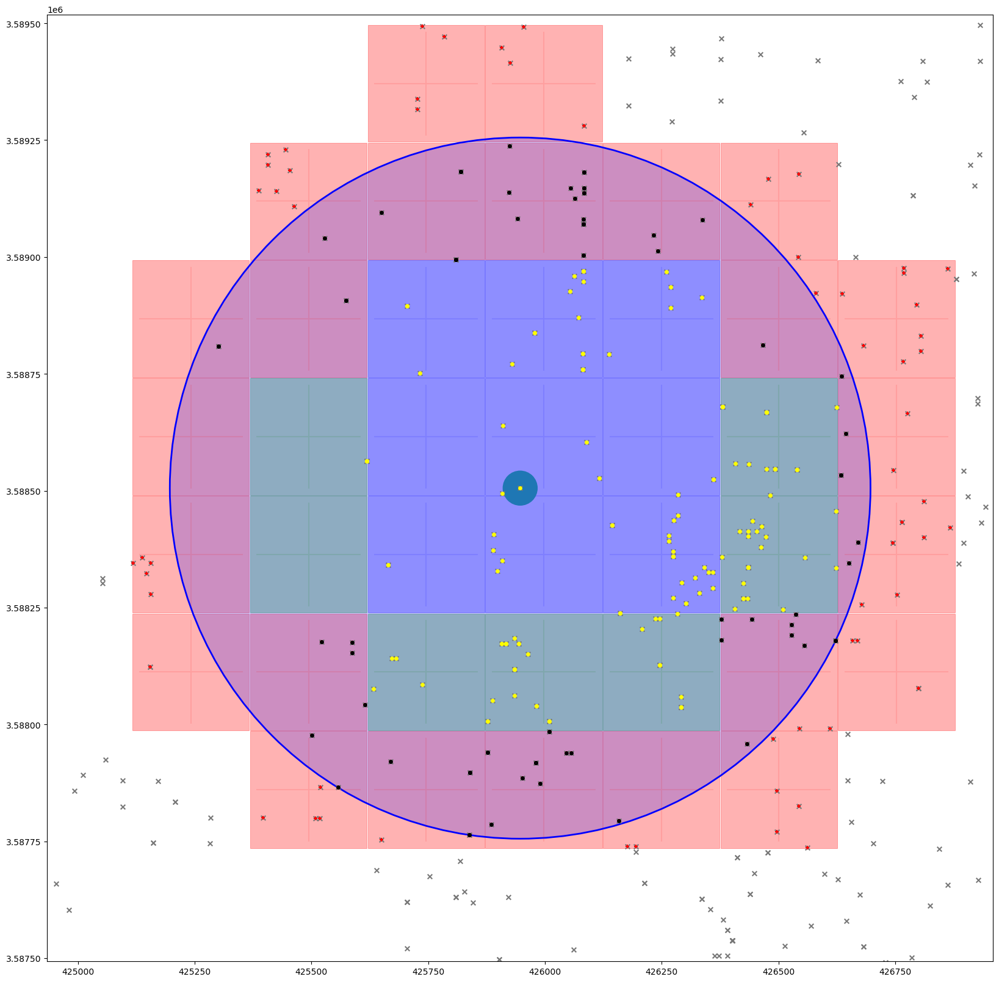

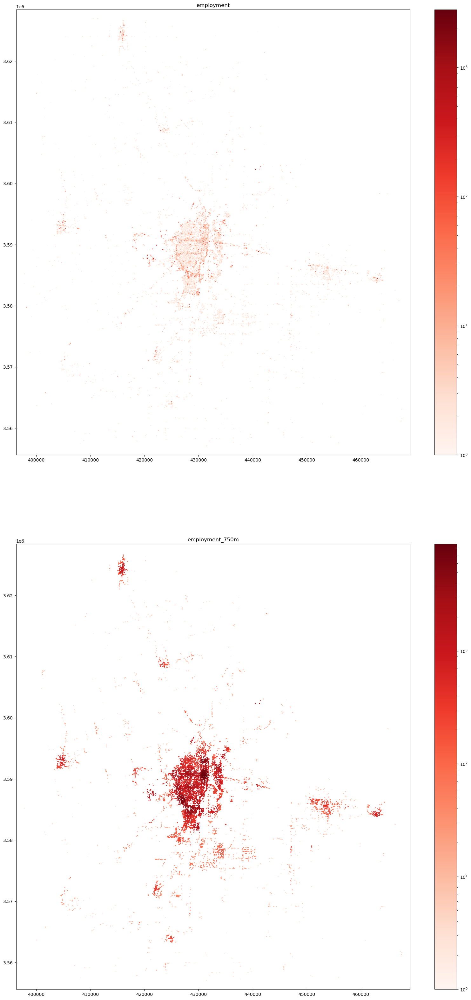

In [4]:
radius_search(
    pts_df=pts_df,
    radius=750,
    sum_names=['employment'],
    silent = True,
)

counter_new_cell 0.366 cn 0.751 ov 0.754


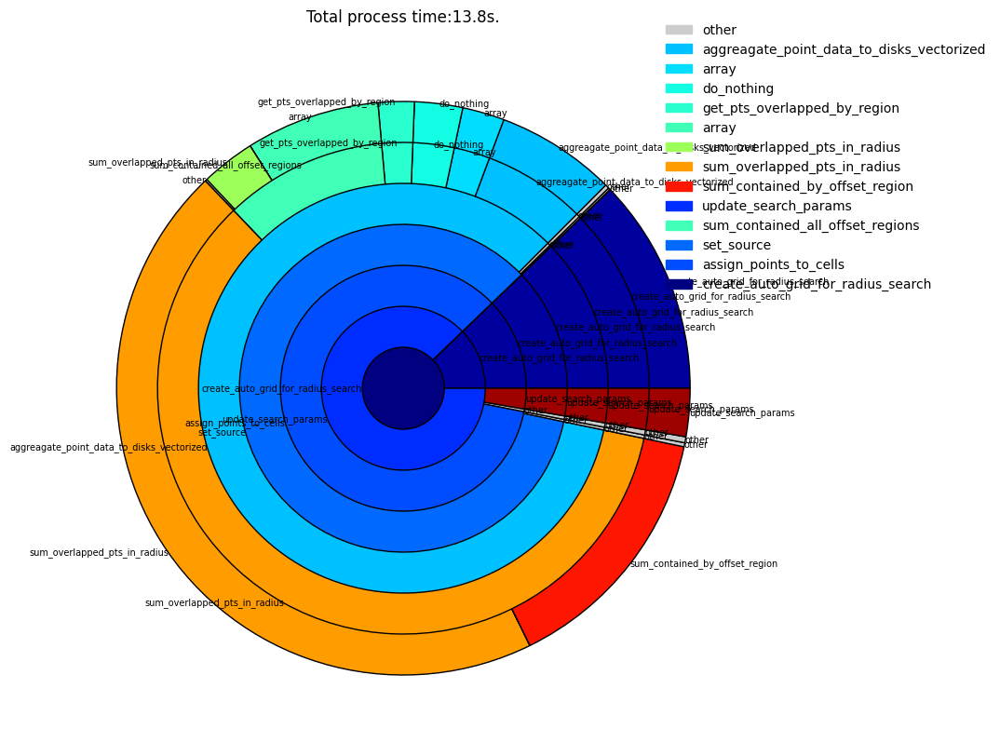

func_name
__init__                                     1.687497
add_attributes_to_tree                       0.000000
aggreagate_point_data_to_disks_vectorized    0.937497
aggregate_point_data_to_cells                0.374997
array                                        2.421397
assign_points_to_cells                       0.078119
assign_points_to_mirco_regions               0.000000
create_auto_grid_for_radius_search           0.000000
create_bilateral_comp_mx_smaller_than        0.000000
do_nothing                                   0.281194
gen_weak_order_rel_to_convex_set             0.000000
get_pt_to_cell_centroid_cell_offset          0.015622
get_pts_overlapped_by_region                 1.046666
prepare_offset_regions                       0.031247
set_source                                   0.000000
set_target                                   0.000000
sum_contained_all_offset_regions             0.328059
sum_contained_by_offset_region               0.374925
sum_overlapped_pts

In [4]:
radius_search(
    pts_df=pts_df,
    radius=750,
    sum_names=['employment'],
    silent = True,
)
perf_analysis = analyze_func_perf(plot=True)
perf_analysis['grp_df'].groupby('func_name')['process_time'].sum()

counter_new_cell 0.261 cn 0.629 ov 0.633
create plot for radius sums


,eid,employment,industry,lat,lon,moved,id_y,id_x,region_comb_nr,cell_region,triangle_id,employment_750m
count,1.516100e+04,15161.000000,15161.000000,1.516100e+04,15161.000000,15161.000000,15161.000000,15161.000000,15161.000000,15161.000000,15161.000000,15161.000000
mean,2.734620e+08,6.282171,521830.683992,3.588387e+06,429718.656122,9007.535980,124.079546,126.778445,163.432557,33753.648704,4.425170,1371.640063
std,3.453785e+08,36.265000,176899.278753,9.391793e+03,9145.503732,2634.487361,37.299858,36.325684,114.519325,21574.639657,2.299383,1861.809634
min,1.004717e+06,1.000000,221.000000,3.557083e+06,397755.860451,1990.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,2.445476e+07,1.000000,449129.000000,3.584657e+06,427020.752270,9999.000000,109.000000,116.000000,69.000000,17023.000000,2.000000,163.000000
50%,7.045902e+07,2.000000,541810.000000,3.588506e+06,429107.445328,9999.000000,125.000000,124.000000,168.000000,36067.000000,4.000000,700.000000
75%,6.134285e+08,3.000000,561990.000000,3.591108e+06,431551.815726,9999.000000,135.000000,134.000000,270.000000,55081.000000,6.000000,1670.000000
max,9.699975e+08,2800.000000,928110.000000,3.626948e+06,467584.063239,9999.000000,277.000000,277.000000,404.000000,76116.000000,8.000000,9179.000000


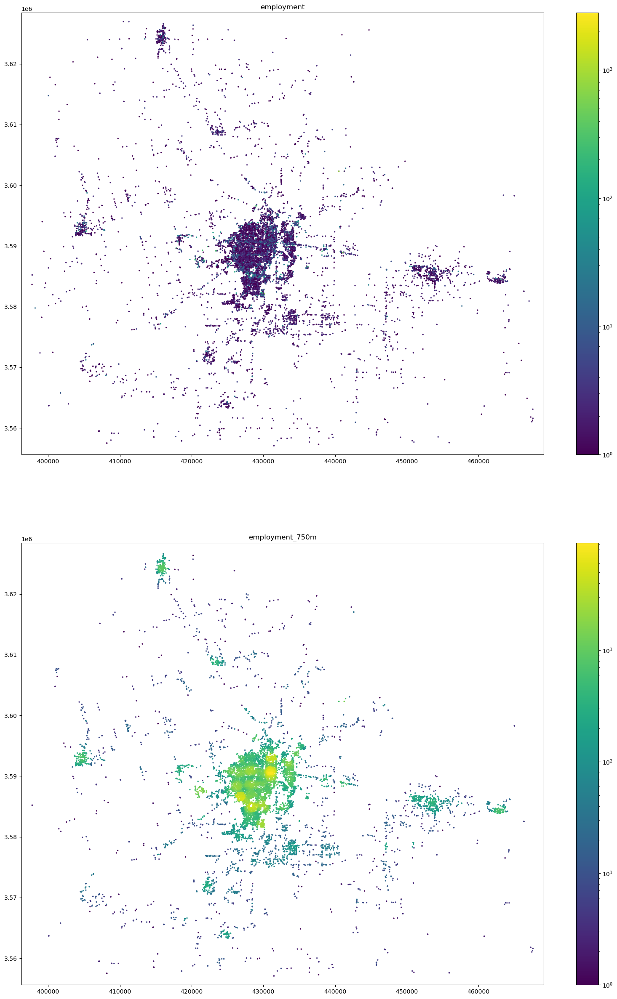

In [ ]:
# only calculate sums (no clustering)
grid = radius_search(
    pts_df=pts_df, 
    radius=750, 
    sum_names=['employment'],
    plot_radius_sums={'figsize':(20,30), 'cmap': 'viridis'},
    # plot_offset_checks={},
    # plot_cell_reg_assign={},
    # plot_offset_regions={},
    # plot_offset_raster={},
    # plot_pt_disk={},
    silent=True
)

# some plots on internal processes

row: eid                        619603868
employment                       100
industry                      722511
lat                   3588604.322022
lon                    426088.590844
moved                           9999
id_y                             125
id_x                             112
region_comb_nr                    14
cell_region                     8009
triangle_id                        8
employment_750m                    0
employment_cluster              True
initial_sort                    7580
Name: 12293, dtype: object
cells_cntd_by_pt_cell [(124, 111), (124, 112), (124, 113), (125, 111), (125, 112), (125, 113), (126, 111), (126, 112), (126, 113)]
cells_contained_by_pt_region [(123, 112), (123, 113), (124, 114), (125, 110), (125, 114), (126, 114), (127, 112), (127, 113)]
cells_overlapped_by_pt_region [(122, 111), (122, 112), (122, 113), (122, 114), (123, 110), (123, 111), (123, 114), (123, 115), (124, 109), (124, 110), (124, 115), (125, 109), (125, 115), (126, 

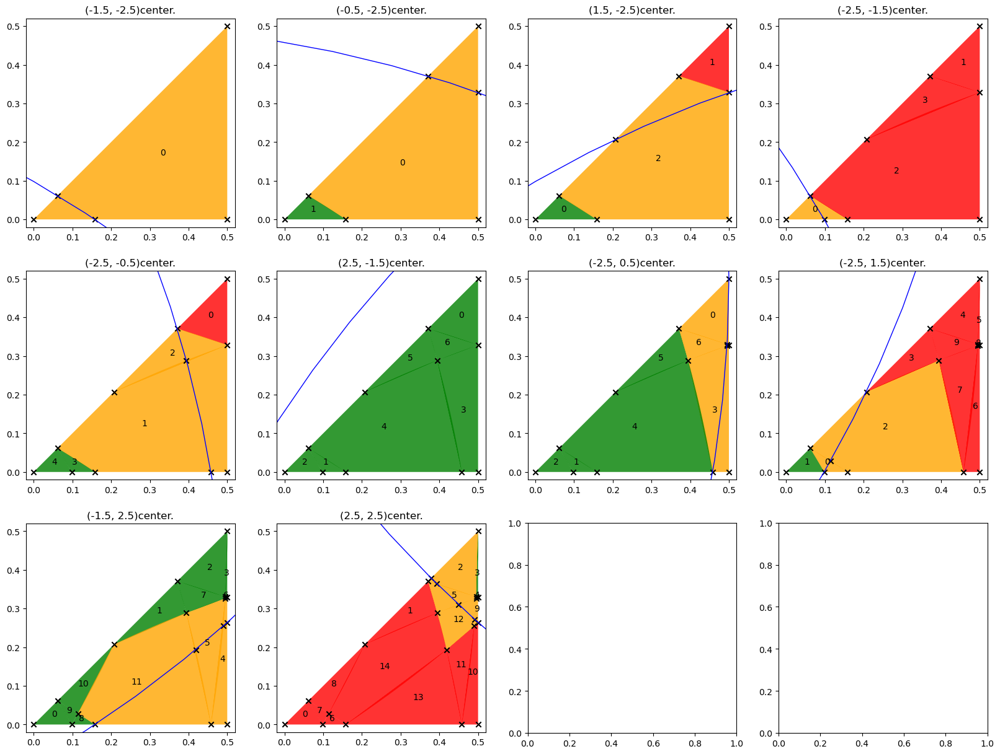

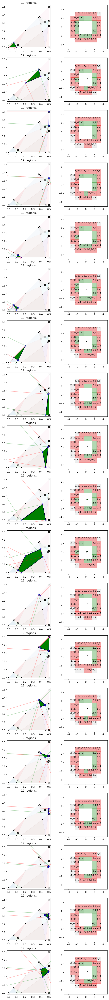

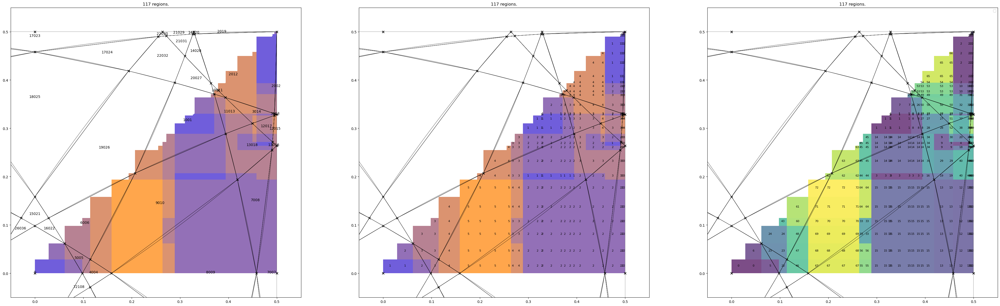

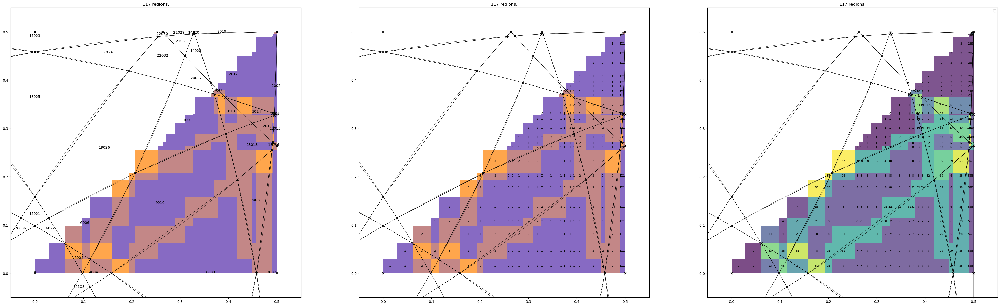

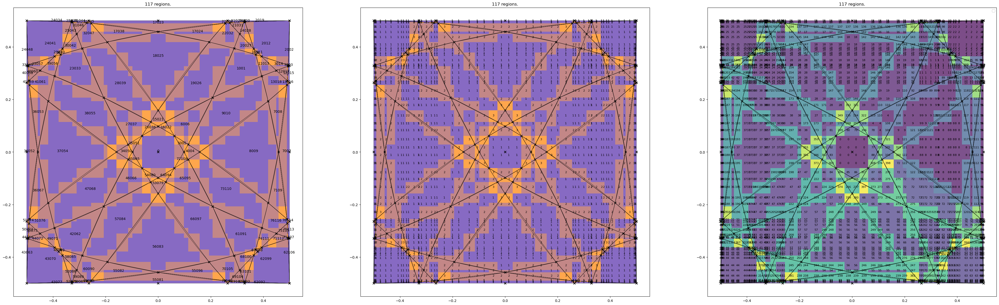

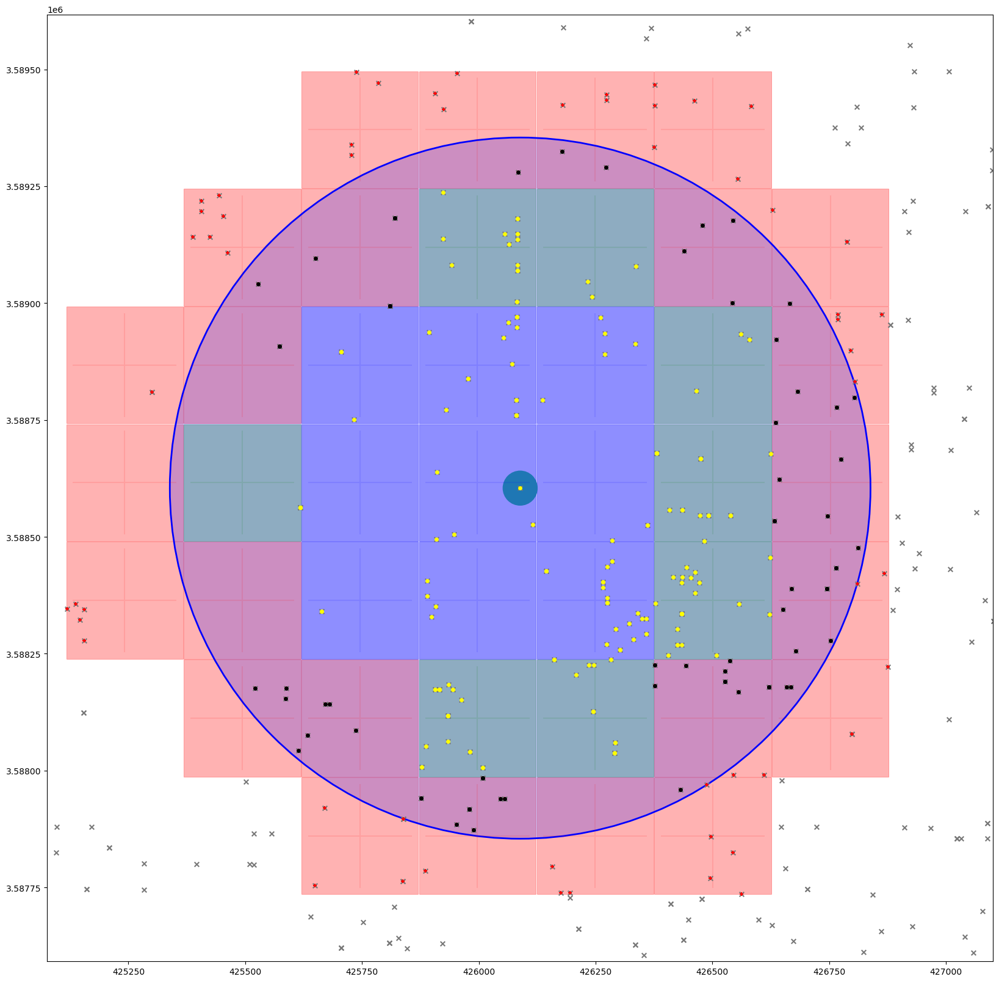

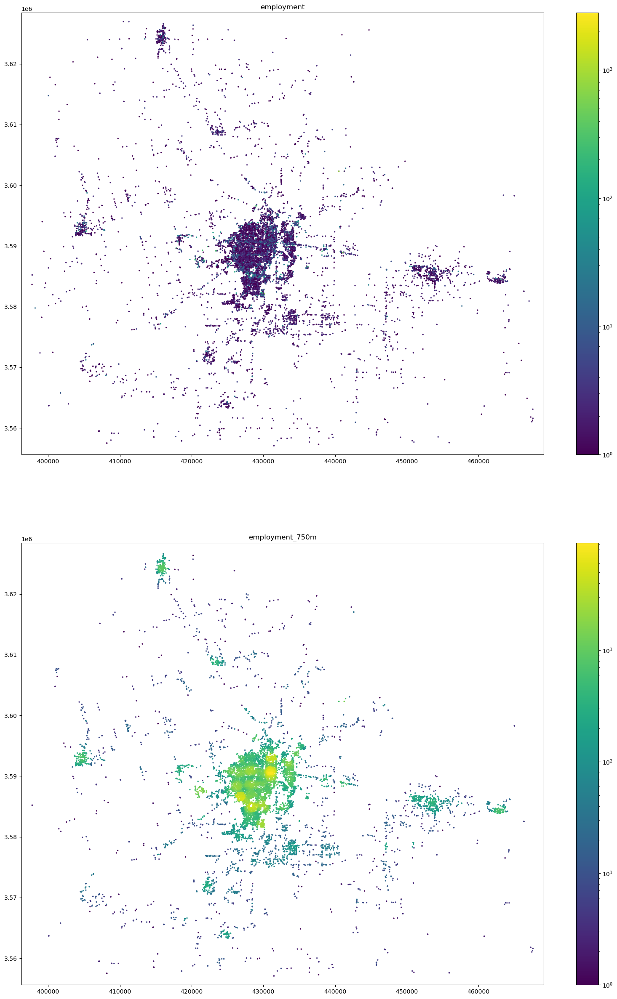

In [11]:
grid = radius_search(
    pts_df=pts_df, 
    radius=750, 
    sum_names=['employment'],
    plot_radius_sums={'figsize':(20,30), 'cmap': 'viridis'},
    plot_cell_reg_assign={},
    plot_offset_checks={},
    plot_offset_regions={},
    plot_offset_raster={},
    plot_pt_disk={},
    silent=True
)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
n region 19
n cells in triangle: 406
mean regions at raster cell 2.5098522167487687
unique_reg_id_combs_in_raster_cells {(0,): [(1, 1), (2, 1)], (0, 6006): [(2, 2)], (0, 5005): [(3, 1)], (0, 5005, 6006): [(3, 2), (4, 2)], (0, 6006, 16022): [(3, 3), (4, 3)], (0, 4004, 5005): [(4, 1)], (6006, 15021, 16022): [(4, 4)], (0, 4004, 5005, 9010): [(5, 1)], (0, 5005, 6006, 9010): [(5, 2)], (0, 6006, 9010, 16022): [(5, 3)], (6006, 9010, 15021, 16022): [(5, 4)], (6006, 9010, 15021, 19026): [(5, 5)], (0, 4004, 5005, 8009, 9010): [(6, 1), (7, 1), (8, 1), (9, 1)], (0, 5005, 6006, 8009, 9010): [(6, 2), (7, 2), (8, 2), (9, 2)], (0, 6006, 8009, 9010, 16022): [(6, 3), (7, 3), (8, 3), (9, 3)], (6006, 8009, 9010, 15021, 16022): [(6, 4), (7, 4), (8, 4), (9, 4)], (6006, 8009, 9010, 15021, 19026): [(6, 5), (7, 5), (8, 5), (9, 5)], (6006, 8009, 9010, 18025, 19026): [(6, 6), (7, 6), (8, 6), (9, 6)], (6006, 9010, 18025, 19026

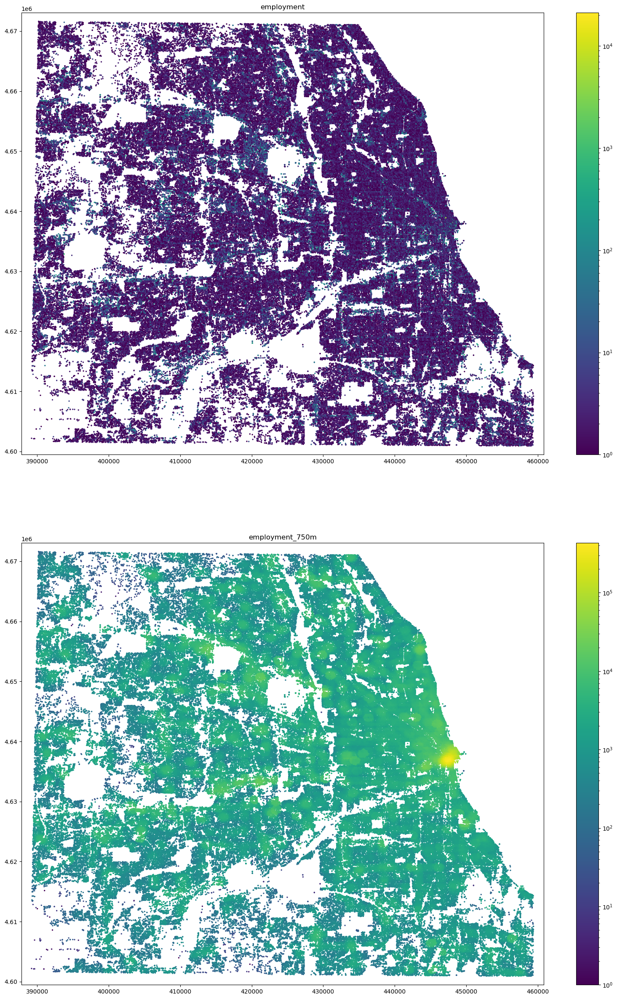

name other 0.0 0.0 i 3 grps 26
name create_auto_grid_for_radius_search-gen_weak_order_rel_to_convex_set 3.3124953125 0.19013507860841017 i 3 grps 26
name create_auto_grid_for_radius_search-set_source-assign_points_to_cells 5.1093703125 0.29327453606975173 i 3 grps 26
name create_auto_grid_for_radius_search-set_target-__init__ 3.6093609375 0.20717497259181028 i 3 grps 26
name create_auto_grid_for_radius_search-set_target-aggregate_point_data_to_cells 4.5156203125 0.25919367186513453 i 3 grps 26
name create_auto_grid_for_radius_search-set_target-set_source-assign_points_to_mirco_regions 0.3124953125 0.017937027890344286 i 3 grps 26
name create_auto_grid_for_radius_search-update_search_params 0.2812453125 0.01614329819536443 i 3 grps 26
name create_auto_grid_for_radius_search-add_attributes_to_tree 3.4687359375 0.19910318896440096 i 2 grps 20
name create_auto_grid_for_radius_search-assign_points_to_cells 5.1093703125 0.29327453606975173 i 2 grps 20
name create_auto_grid_for_radius_search-

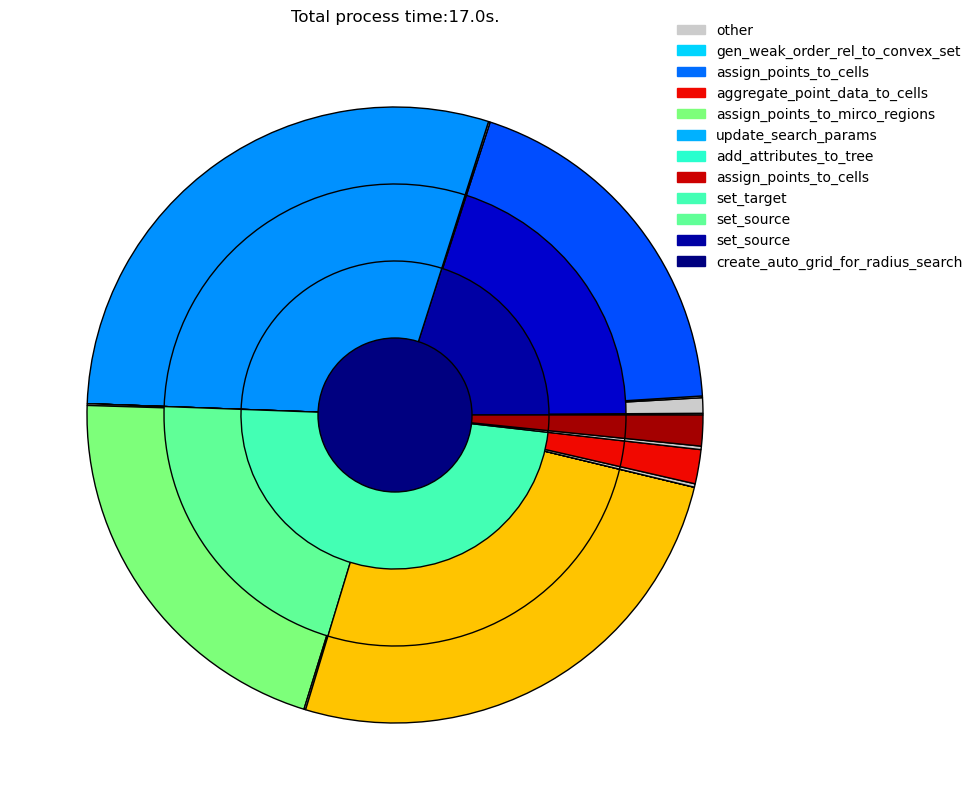

In [6]:
# perf_analysis = analyze_func_perf(plot=True)

2

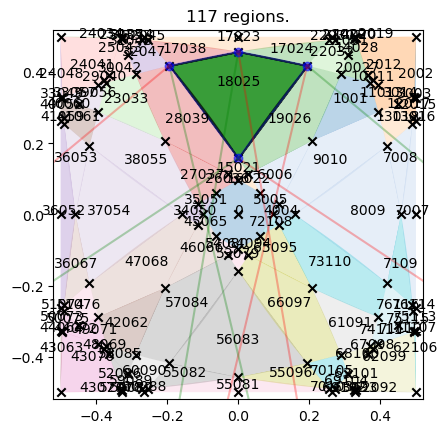

In [10]:
reg_id = 18025
regions = list(grid.search.id_to_offset_regions.values())
fig, ax = plt.subplots()
regions[0].plot_many(regions,ax=ax, x_lim=(-0.52,0.52), y_lim=(-0.52,0.52))
grid.search.id_to_offset_regions[reg_id].plot_single(ax=ax, x_lim=(-0.52,0.52), y_lim=(-0.52,0.52))
grid.search.id_to_offset_regions[reg_id].trgl_nr


<Axes: >

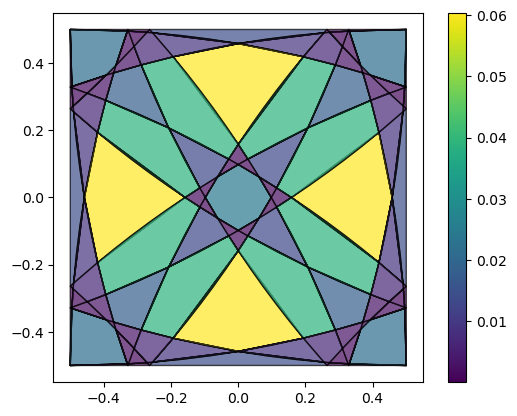

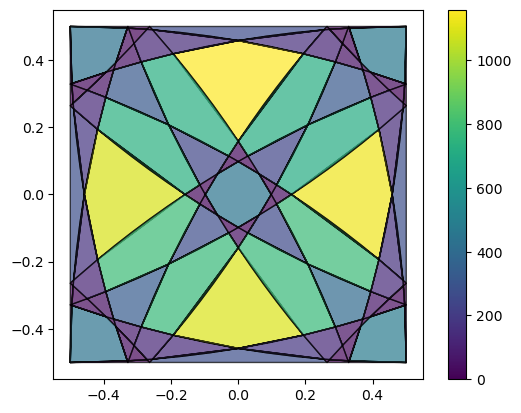

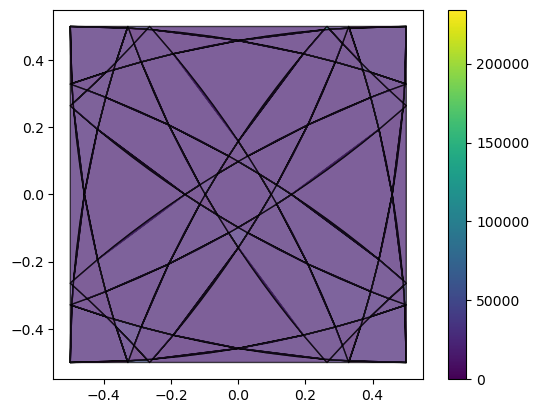

In [5]:
import geopandas as gpd
from shapely.geometry import Polygon
ns = []
geoms = []
total_area = 0
areas = []
n_pts = []
densities = []
for k,v in grid.search.id_to_offset_regions.items():
    area = v.calc_area(100)
    areas.append(area)
    n = sum(pts_df['cell_region']==k)
    n_pts.append(n)
    densities.append(n/area)
    total_area += area
    ns.append((n, k, v.trgl_nr, round(area*10000)))
    
    geoms.append(Polygon(v.get_plot_coords(1)))
ns.sort(key = lambda x: x[0])
df = gpd.GeoDataFrame({'areas':areas, 'n_pts':n_pts, 'densities':densities}, geometry=geoms)
df.plot('areas',cmap='viridis', edgecolor='black', alpha=0.7, legend=True)
df.plot('n_pts',cmap='viridis', edgecolor='black', alpha=0.7, legend=True)
df.plot('densities',cmap='viridis', edgecolor='black', alpha=0.7, legend=True)

In [4]:
import geopandas as gpd
from shapely.geometry import Point
df = gpd.GeoDataFrame({'cell_region':pts_df['cell_region'], 'triangle_id':pts_df['triangle_id']},geometry=[Point(c) for c in pts_df[['offset_x', 'offset_y']].values])
fig, ax = plt.subplots(figsize=(10,10))

df.plot('cell_region', ax=ax, cmap='tab20', s=1.8, legend=True)
list(grid.search.id_to_offset_regions.values())[0].plot_many(
    regions=list(grid.search.id_to_offset_regions.values()),
    facecolor='None', edgecolor='black', add_idxs=False, ax=ax, x_lim=(-0.52,0.52), y_lim=(-0.52,0.52))


KeyError: "None of [Index(['offset_x', 'offset_y'], dtype='object')] are in the [columns]"

In [4]:
def check_orienation(points:list):
    signedArea = 0
    n = len(points)
    for i in range(n):
        x1 = points[i][0]
        y1 = points[i][1]
        x2 = points[(i+1)%n][0]
        y2 = points[(i+1)%n][1]
        signedArea += (x1 * y2 - x2 * y1)
    return signedArea / 2

Axes(0.125,0.53;0.352273x0.35)
Axes(0.547727,0.53;0.352273x0.35)
Axes(0.125,0.11;0.352273x0.35)
Axes(0.547727,0.11;0.352273x0.35)


Text(0.5, 1.0, 'id_y')

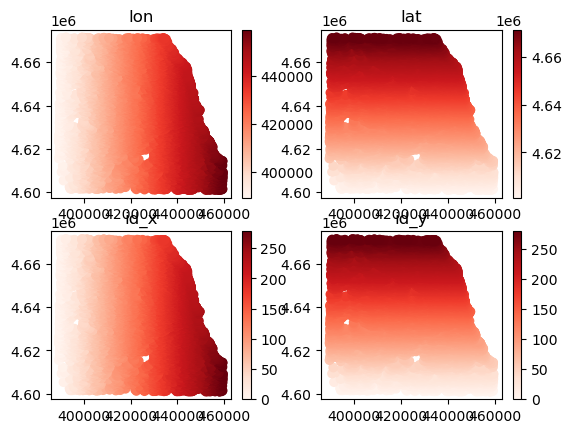

In [11]:
fig, axs = plt.subplots(nrows=2,ncols=2)
print(axs.flat[0])
sc = axs.flat[0].scatter(x=pts_df['lon'],y=pts_df['lat'],c=pts_df['lon'],cmap='Reds')
plt.colorbar(sc)
axs.flat[0].set_title("lon")
print(axs.flat[1])
sc = axs.flat[1].scatter(x=pts_df['lon'],y=pts_df['lat'],c=pts_df['lat'],cmap='Reds')
plt.colorbar(sc)
axs.flat[1].set_title("lat")
print(axs.flat[2])
sc = axs.flat[2].scatter(x=pts_df['lon'],y=pts_df['lat'],c=pts_df['id_x'],cmap='Reds')
plt.colorbar(sc)
axs.flat[2].set_title("id_x")
print(axs.flat[3])
sc = axs.flat[3].scatter(x=pts_df['lon'],y=pts_df['lat'],c=pts_df['id_y'],cmap='Reds')
plt.colorbar(sc)
axs.flat[3].set_title("id_y")

### Read in grid

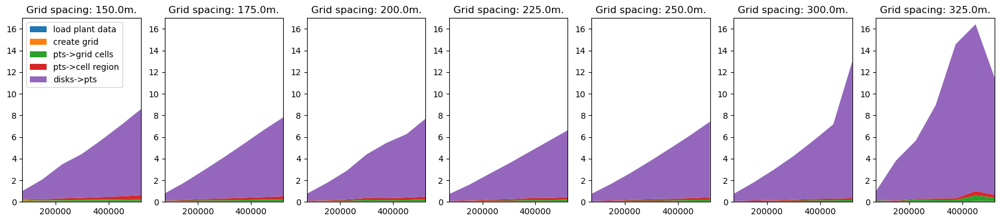

In [ ]:
n_rows, n_cols =1,len(df_timer_dict['nested']['grid_spacing'].circle_2s())
col_max = 6
ymax = max([
    math.ceil(max([(df_timer_i.loc[:,i]-df_timer_i.loc[:,0]).apply(lambda x: x.total_seconds()/60).max() 
    for i in range(1,len(df_timer_i.columns)-4) if i in range(6)])) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()
])
xmin = min([min(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()])
xmax = max([max(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()])
fig,axs = plt.subplots(n_rows, n_cols, figsize=(3*n_cols,4*n_rows))
for n, (circle_2,df_timer_i) in enumerate(df_timer_dict['nested']['grid_spacing'].items()):
    axs.flat[n].stackplot(
    df_timer_i['n_points'],*[(df_timer_i.loc[:,i]-df_timer_i.loc[:,i-1]).apply(lambda x: x.total_seconds()/60) for i in range(1,len(df_timer_i.columns)-4) if i in range(col_max)],
    )
    axs.flat[n].set_title('Grid spacing: '+str(round(circle_2*100000,0))+'m.') 

    axs.flat[n].set_xlim(xmin,xmax)
    axs.flat[n].set_ylim(0,ymax)
    if n==0:
        axs.flat[n].legend(loc="upper left", labels=['load plant data', 'create grid', 'pts->grid cells', 'pts->cell region', 'disks->pts'],prop={'size': 10})

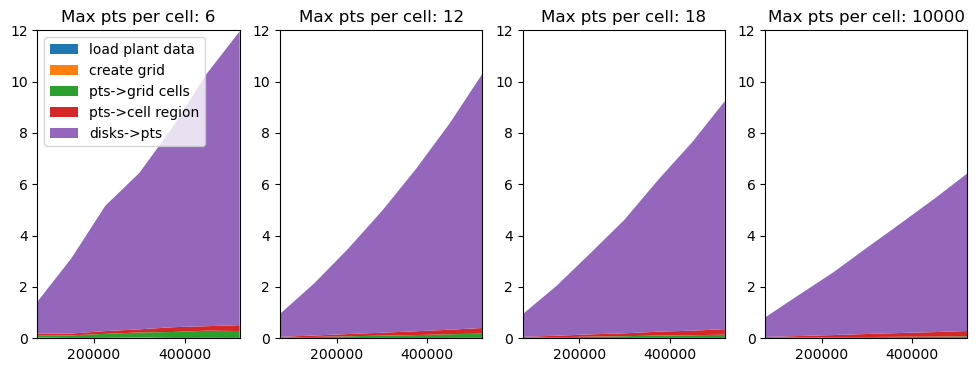

In [ ]:
n_rows, n_cols =1,len(df_timer_dict['nested']['max_pts_per_cell'].circle_2s())
col_max = 6
ymax = max([
    math.ceil(max([(df_timer_i.loc[:,i]-df_timer_i.loc[:,0]).apply(lambda x: x.total_seconds()/60).max() 
    for i in range(1,len(df_timer_i.columns)-4) if i in range(6)])) for df_timer_i in df_timer_dict['nested']['max_pts_per_cell'].values()
])
xmin = min([min(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['max_pts_per_cell'].values()])
xmax = max([max(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['max_pts_per_cell'].values()])
fig,axs = plt.subplots(n_rows, n_cols, figsize=(3*n_cols,4*n_rows))
for n, (circle_2,df_timer_i) in enumerate(df_timer_dict['nested']['max_pts_per_cell'].items()):
    axs.flat[n].stackplot(
    df_timer_i['n_points'],*[(df_timer_i.loc[:,i]-df_timer_i.loc[:,i-1]).apply(lambda x: x.total_seconds()/60) for i in range(1,len(df_timer_i.columns)-4) if i in range(col_max)],
    )
    axs.flat[n].set_title('Max pts per cell: '+str(round(circle_2))) 

    axs.flat[n].set_xlim(xmin,xmax)
    axs.flat[n].set_ylim(0,ymax)
    if n==0:
        axs.flat[n].legend(loc="upper left", labels=['load plant data', 'create grid', 'pts->grid cells', 'pts->cell region', 'disks->pts'],prop={'size': 10})

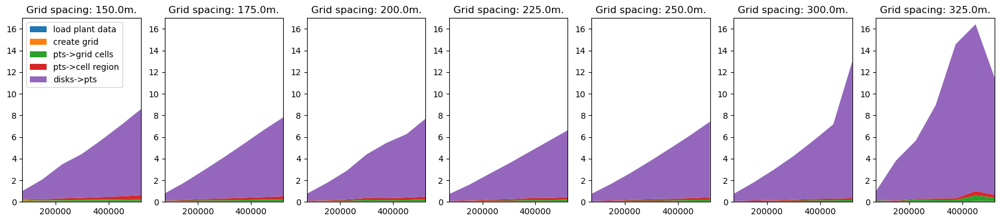

In [ ]:
n_rows, n_cols =1,len(df_timer_dict['nested']['grid_spacing'].circle_2s())
col_max = 6
ymax = max([
    math.ceil(max([(df_timer_i.loc[:,i]-df_timer_i.loc[:,0]).apply(lambda x: x.total_seconds()/60).max() 
    for i in range(1,len(df_timer_i.columns)-4) if i in range(6)])) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()
])
xmin = min([min(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()])
xmax = max([max(df_timer_i['n_points']) for df_timer_i in df_timer_dict['nested']['grid_spacing'].values()])
fig,axs = plt.subplots(n_rows, n_cols, figsize=(3*n_cols,4*n_rows))
for n, (circle_2,df_timer_i) in enumerate(df_timer_dict['nested']['grid_spacing'].items()):
    axs.flat[n].stackplot(
    df_timer_i['n_points'],*[(df_timer_i.loc[:,i]-df_timer_i.loc[:,i-1]).apply(lambda x: x.total_seconds()/60) for i in range(1,len(df_timer_i.columns)-4) if i in range(col_max)],
    )
    axs.flat[n].set_title('Grid spacing: '+str(round(circle_2*100000,0))+'m.') 

    axs.flat[n].set_xlim(xmin,xmax)
    axs.flat[n].set_ylim(0,ymax)
    if n==0:
        axs.flat[n].legend(loc="upper left", labels=['load plant data', 'create grid', 'pts->grid cells', 'pts->cell region', 'disks->pts'],prop={'size': 10})